In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys
sys.path.append("/n/home12/binxuwang/Github/Closed-loop-visual-insilico")
import timm
import torch
import torch as th
import torch.nn as nn
from torchvision.models.feature_extraction import create_feature_extractor
from tqdm.auto import tqdm
from os.path import join
import pickle as pkl
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from horama import maco, plot_maco
import torchvision.transforms as T
from torchvision.transforms import ToPILImage, ToTensor, Normalize, Resize
from torchvision.models import resnet50
from circuit_toolkit.CNN_scorers import TorchScorer
from circuit_toolkit.GAN_utils import upconvGAN, Caffenet
from circuit_toolkit.plot_utils import to_imgrid, show_imgrid, save_imgrid, saveallforms
from circuit_toolkit.layer_hook_utils import featureFetcher_module, featureFetcher, get_module_names
from circuit_toolkit.dataset_utils import ImagePathDataset
from torch.utils.data import DataLoader
from neural_regress.regress_lib import sweep_regressors
from neural_regress.sklearn_torchify_lib import SRP_torch, PCA_torch, LinearRegression_torch, SpatialAvg_torch

import sklearn
from sklearn.pipeline import make_pipeline
from sklearn.random_projection import SparseRandomProjection, GaussianRandomProjection
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import RidgeCV
from sklearn.decomposition import PCA
from sklearn.kernel_ridge import KernelRidge

#%% Utility Functions
from core.data_utils import load_from_hdf5, load_neural_data, load_neural_trial_resp_tensor, create_response_tensor

In [4]:
from core.data_utils import load_neural_data, load_from_hdf5, load_neural_trial_resp_tensor, create_response_tensor
dataroot = r"/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Ephys_Data"
data_path = join(dataroot, "red_20250428-20240429_vvs-encodingstimuli_z1_rw100-400.h5")
data = load_from_hdf5(data_path)

In [5]:
print("subjects:", list(data.keys()))

subjects: ['README', 'neuron_metadata', 'repavg', 'stimulus_meta', 'trials']


In [37]:
list(data)

['README', 'neuron_metadata', 'repavg', 'stimulus_meta', 'trials']

In [38]:
data['neuron_metadata']

{'brain_area': {'plexon': array([b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT',
         b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT',
         b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT',
         b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT',
         b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT',
         b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT',
         b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT',
         b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT',
         b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT',
         b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT',
         b'l_aIT', b'l_aIT', b'l_aIT', b'l_aIT'], dtype=object)},
 'mu': array([[ 5.16410971,  1.3913368 , 29.3072319 ,  1.26431906,  1.93795145,
          2.4941237 ,  5.70850801,  0.82452428,  1.00514293,  8.37772846,
          1.57415164,  8.2026062 ,  1.82157922,  1.17658103,  1.73

In [8]:
data["stimulus_meta"]

{'duration_ms': array([167, 167, 167, ..., 167, 167, 167]),
 'isi_ms': array([200, 200, 200, ..., 200, 200, 200]),
 'ppd': array([35.31106593, 35.31106593, 35.31106593, ..., 35.31106593,
        35.31106593, 35.31106593]),
 'size_px': array([[282, 282],
        [282, 282],
        [282, 282],
        ...,
        [282, 282],
        [282, 282],
        [282, 282]], dtype=uint16),
 'xy_deg': array([[2, 0],
        [2, 0],
        [2, 0],
        ...,
        [2, 0],
        [2, 0],
        [2, 0]], dtype=uint8)}

In [9]:
list(data['repavg'])

['response_peak', 'response_temporal', 'stimulus_name']

In [10]:
resp_peak = data['repavg']["response_peak"]
stim_name = data['repavg']["stimulus_name"]

In [12]:
list(stim_name)

[b'BigAnimate_20.png',
 b'BigAnimate_60.png',
 b'FFM_022.png',
 b'FFM_030.png',
 b'FFM_037.png',
 b'FFM_041.png',
 b'FFM_113.png',
 b'FFM_119.png',
 b'FFM_196.png',
 b'FFM_202.png',
 b'FFM_208.png',
 b'FFM_240.png',
 b'FH_12.png',
 b'FH_120.png',
 b'FH_128.png',
 b'FH_129.png',
 b'FH_134.png',
 b'FH_135.png',
 b'FH_138.png',
 b'FH_144.png',
 b'FH_148.png',
 b'FH_151.png',
 b'FH_154.png',
 b'FH_156.png',
 b'FH_159.png',
 b'FH_160.png',
 b'FH_165.png',
 b'FH_166.png',
 b'FH_168.png',
 b'FH_174.png',
 b'FH_175.png',
 b'FH_178.png',
 b'FH_181.png',
 b'FH_190.png',
 b'FH_196.png',
 b'FH_197.png',
 b'FH_198.png',
 b'FH_204.png',
 b'FH_206.png',
 b'FH_21.png',
 b'FH_215.png',
 b'FH_218.png',
 b'FH_219.png',
 b'FH_226.png',
 b'FH_227.png',
 b'FH_228.png',
 b'FH_235.png',
 b'FH_238.png',
 b'FH_243.png',
 b'FH_246.png',
 b'FH_25.png',
 b'FH_256.png',
 b'FH_257.png',
 b'FH_258.png',
 b'FH_263.png',
 b'FH_266.png',
 b'FH_270.png',
 b'FH_282.png',
 b'FH_31.png',
 b'FH_33.png',
 b'FH_4.png',
 b'FH_6

### Check all the files exist

In [15]:
!ls /n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Stimuli/encodingstimuli_apr2025

 apple_04.jpg			     shared0333_nsd25694.png
 armyguy_01.jpg			     shared0334_nsd25703.png
 armyguy_06.jpg			     shared0336_nsd25742.png
 axe_09.jpg			     shared0338_nsd25882.png
 babycarriage_13.jpg		     shared0339_nsd25907.png
 backpack_07.jpg		     shared0340_nsd25960.png
 bagel_03.jpg			     shared0341_nsd26120.png
 bagel_10.jpg			     shared0344_nsd26244.png
 ball_13.jpg			     shared0345_nsd26293.png
 balloon_07.jpg			     shared0346_nsd26308.png
 baseballcards_01.jpg		     shared0347_nsd26352.png
 baseballcards_02.jpg		     shared0350_nsd26459.png
 baseballcards_14.jpg		     shared0352_nsd26721.png
 bathsuit_07.jpg		     shared0354_nsd26896.png
 BigAnimate_20.jpg		     shared0355_nsd26910.png
 BigAnimate_60.jpg		     shared0356_nsd26972.png
 bill_01.jpg			     shared0357_nsd26991.png
 bill_08.jpg			     shared0358_nsd27243.png
 bill_09.jpg			     shared0359_nsd27276.png
 bill_14.jpg			     shared0360_nsd27288.png
 bottle_11.jpg			     shared0361_nsd27327.png
 bottle_15.jpg		

In [23]:
from core.data_utils import parse_image_fullpaths

In [24]:
encoding_stim_dir = r"/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Stimuli/encodingstimuli_apr2025"
stim_name = data['repavg']["stimulus_name"]
stim_name_str = [stim_name.decode('utf8') for stim_name in stim_name]
image_fps = parse_image_fullpaths(stim_name_str, [encoding_stim_dir], arbitrary_format=True)
image_fps

All stimulus files were found


['/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Stimuli/encodingstimuli_apr2025/BigAnimate_20.jpg',
 '/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Stimuli/encodingstimuli_apr2025/BigAnimate_60.jpg',
 '/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Stimuli/encodingstimuli_apr2025/FFM_022.jpg',
 '/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Stimuli/encodingstimuli_apr2025/FFM_030.jpg',
 '/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Stimuli/encodingstimuli_apr2025/FFM_037.jpg',
 '/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Stimuli/encodingstimuli_apr2025/FFM_041.jpg',
 '/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Stimuli/encodingstimuli_apr2025/FFM_113.jpg',
 '/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Stimuli/encodingstimuli_apr2025/FFM_119.jpg',
 '/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Stimuli/encodingstimuli_apr2025/FFM_196.jpg',
 '/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Stimuli/encodingstimuli_apr2025/FFM_202.jpg',
 '/n/hol

In [18]:
stim_name_str

['BigAnimate_20.png',
 'BigAnimate_60.png',
 'FFM_022.png',
 'FFM_030.png',
 'FFM_037.png',
 'FFM_041.png',
 'FFM_113.png',
 'FFM_119.png',
 'FFM_196.png',
 'FFM_202.png',
 'FFM_208.png',
 'FFM_240.png',
 'FH_12.png',
 'FH_120.png',
 'FH_128.png',
 'FH_129.png',
 'FH_134.png',
 'FH_135.png',
 'FH_138.png',
 'FH_144.png',
 'FH_148.png',
 'FH_151.png',
 'FH_154.png',
 'FH_156.png',
 'FH_159.png',
 'FH_160.png',
 'FH_165.png',
 'FH_166.png',
 'FH_168.png',
 'FH_174.png',
 'FH_175.png',
 'FH_178.png',
 'FH_181.png',
 'FH_190.png',
 'FH_196.png',
 'FH_197.png',
 'FH_198.png',
 'FH_204.png',
 'FH_206.png',
 'FH_21.png',
 'FH_215.png',
 'FH_218.png',
 'FH_219.png',
 'FH_226.png',
 'FH_227.png',
 'FH_228.png',
 'FH_235.png',
 'FH_238.png',
 'FH_243.png',
 'FH_246.png',
 'FH_25.png',
 'FH_256.png',
 'FH_257.png',
 'FH_258.png',
 'FH_263.png',
 'FH_266.png',
 'FH_270.png',
 'FH_282.png',
 'FH_31.png',
 'FH_33.png',
 'FH_4.png',
 'FH_63.png',
 'FH_66.png',
 'FH_71.png',
 'FH_73.png',
 'FH_74.png'

Create datasets

In [25]:
from circuit_toolkit.dataset_utils import ImagePathDataset
from torch.utils.data import DataLoader

In [28]:
transforms_pipeline = T.Compose([
    T.ToTensor(),
    T.Resize((224, 224)),
    # T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
# Example 1: Basic usage with just image paths
dataset = ImagePathDataset(image_fps, scores=None, transform=transforms_pipeline, )

The (227, 227) setting is overwritten by the size in custom transform


Sample images

In [46]:
len(dataset)

969

In [47]:
stim_name_str

['BigAnimate_20.png',
 'BigAnimate_60.png',
 'FFM_022.png',
 'FFM_030.png',
 'FFM_037.png',
 'FFM_041.png',
 'FFM_113.png',
 'FFM_119.png',
 'FFM_196.png',
 'FFM_202.png',
 'FFM_208.png',
 'FFM_240.png',
 'FH_12.png',
 'FH_120.png',
 'FH_128.png',
 'FH_129.png',
 'FH_134.png',
 'FH_135.png',
 'FH_138.png',
 'FH_144.png',
 'FH_148.png',
 'FH_151.png',
 'FH_154.png',
 'FH_156.png',
 'FH_159.png',
 'FH_160.png',
 'FH_165.png',
 'FH_166.png',
 'FH_168.png',
 'FH_174.png',
 'FH_175.png',
 'FH_178.png',
 'FH_181.png',
 'FH_190.png',
 'FH_196.png',
 'FH_197.png',
 'FH_198.png',
 'FH_204.png',
 'FH_206.png',
 'FH_21.png',
 'FH_215.png',
 'FH_218.png',
 'FH_219.png',
 'FH_226.png',
 'FH_227.png',
 'FH_228.png',
 'FH_235.png',
 'FH_238.png',
 'FH_243.png',
 'FH_246.png',
 'FH_25.png',
 'FH_256.png',
 'FH_257.png',
 'FH_258.png',
 'FH_263.png',
 'FH_266.png',
 'FH_270.png',
 'FH_282.png',
 'FH_31.png',
 'FH_33.png',
 'FH_4.png',
 'FH_63.png',
 'FH_66.png',
 'FH_71.png',
 'FH_73.png',
 'FH_74.png'

### Build the neural data kit

In [ ]:
data_path = join(dataroot, "red_20250428-20240429_vvs-encodingstimuli_z1_rw100-400.h5")
data = load_from_hdf5(data_path)

subject_id = "red_20250428-20240429"

data_dict = {}
data_dict['image_fps'] = parse_image_fullpaths(data['repavg']["stimulus_name"], [encoding_stim_dir], arbitrary_format=True)
data_dict['resp_mat'] = data['repavg']["response_peak"]
data_dict['resp_temp_mat'] = data['repavg']["response_temporal"]
data_dict['reliability'] = data['neuron_metadata']["reliability"]
data_dict['ncsnr'] = data['neuron_metadata']["ncsnr"]
data_dict['brain_area'] = data['neuron_metadata']["brain_area"]
data_dict['stim_pos'] = data['stimulus_meta']['xy_deg']
data_dict['stim_size'] = data["stimulus_meta"]["size_px"]

image_fps = data_dict['image_fps']
resp_mat = data_dict['resp_mat']
reliability = data_dict['reliability']
ncsnr = data_dict['ncsnr']

All stimulus files were found


### Train test validation split

In [50]:
import pandas as pd

# Create a DataFrame with the stimulus names
df_stim = pd.DataFrame({'stimulus_name': stim_name_str})

# Add a column indicating whether the stimulus name contains 'shared'
df_stim['is_nsd'] = df_stim['stimulus_name'].str.contains('shared')
df_stim['is_floc'] = df_stim['stimulus_name'].str.contains('fLoc')
df_stim['is_OO'] = ~df_stim['is_nsd'] & ~df_stim['is_floc']
print("NSD: ", df_stim['is_nsd'].sum())
print("fLOC: ", df_stim['is_floc'].sum())
print("OO: ", df_stim['is_OO'].sum())
# Display the DataFrame
df_stim

NSD:  649
fLOC:  61
OO:  259


,stimulus_name,is_nsd,is_floc,is_OO
0,BigAnimate_20.png,False,False,True
1,BigAnimate_60.png,False,False,True
2,FFM_022.png,False,False,True
3,FFM_030.png,False,False,True
4,FFM_037.png,False,False,True
...,...,...,...,...
964,toyhorse_15.png,False,False,True
965,vase_07.png,False,False,True
966,wineglass_13.png,False,False,True
967,yarn_03.png,False,False,True


In [ ]:
# Add a column indicating whether the stimulus name contains 'shared'
df_stim['is_nsd'] = df_stim['stimulus_name'].str.contains('shared')
df_stim['is_floc'] = df_stim['stimulus_name'].str.contains('fLoc')
df_stim['is_OO'] = ~df_stim['is_nsd'] & ~df_stim['is_floc']
print("NSD: ", df_stim['is_nsd'].sum())
print("fLOC: ", df_stim['is_floc'].sum())
print("OO: ", df_stim['is_OO'].sum())


In [70]:
import numpy as np

def select_normalizer_indices(df, partition_col, fraction=None, n_select=None, ):
    """Select indices to use as normalizers from a specific partition.
    
    Args:
        df: DataFrame containing the data
        partition_col: Column name for the partition filter
        total_size: Total size of the dataset
        normalizer_count: Target number of normalizers
        
    Returns:
        List of indices selected as normalizers
    """
    partition_indices = df[df[partition_col]].index.tolist()
    if n_select is None and fraction is not None:
        n_select = int(len(partition_indices) * fraction)
    elif n_select is not None:
        n_select = n_select
    else:
        raise ValueError("Either n_select or fraction must be provided")
    return np.random.choice(partition_indices, size=n_select, replace=False)

def print_partition_stats(df, partition_col, report_col='is_normalizer'):
    """Print statistics about normalizer/non-normalizer split for a partition.
    
    Args:
        df: DataFrame containing the data
        partition_col: Column name for the partition filter
        report_col: Column name for the normalizer indicator
    """
    train_count = df[df[partition_col] & df[report_col]].shape[0]
    test_count = df[df[partition_col] & ~df[report_col]].shape[0]
    total = train_count + test_count
    print(f"{partition_col}: {train_count} train ({train_count/total:.1%}), {test_count} test ({test_count/total:.1%})")


In [93]:
# Set random seed for reproducibility
np.random.seed(0) 
# Initialize normalizer column
df_stim['is_train'] = False
# Select normalizers for each partition
train_indices = select_normalizer_indices(df_stim, 'is_nsd', fraction=0.8)
df_stim.loc[train_indices, 'is_train'] = True
train_indices = select_normalizer_indices(df_stim, 'is_floc', fraction=0.8)
df_stim.loc[train_indices, 'is_train'] = True
train_indices = select_normalizer_indices(df_stim, 'is_OO', fraction=0.8)
df_stim.loc[train_indices, 'is_train'] = True
# Report normalizer/non-normalizer counts for each partition
print("\nTrain/Test split:")
for partition in ['is_nsd', 'is_floc', 'is_OO']:
    print_partition_stats(df_stim, partition, report_col='is_train')
# Overall normalizer/non-normalizer counts
total_train = df_stim['is_train'].sum()
total_test = len(df_stim) - total_train
print(f"Overall: {total_train} train ({total_train/len(df_stim):.1%}), {total_test} test ({total_test/len(df_stim):.1%})")
df_stim["is_test"] = ~df_stim["is_train"]

# Initialize normalizer column
df_stim['is_normalizer'] = False
# Select normalizers for each partition
train_indices = select_normalizer_indices(df_stim[df_stim["is_train"]], 'is_nsd', n_select=33)
df_stim.loc[train_indices, 'is_normalizer'] = True
train_indices = select_normalizer_indices(df_stim[df_stim["is_train"]], 'is_floc', n_select=5)
df_stim.loc[train_indices, 'is_normalizer'] = True
train_indices = select_normalizer_indices(df_stim[df_stim["is_train"]], 'is_OO', n_select=12)
df_stim.loc[train_indices, 'is_normalizer'] = True

# Select normalizers for each partition
train_indices = select_normalizer_indices(df_stim[df_stim["is_test"]], 'is_nsd', n_select=33)
df_stim.loc[train_indices, 'is_normalizer'] = True
train_indices = select_normalizer_indices(df_stim[df_stim["is_test"]], 'is_floc', n_select=5)
df_stim.loc[train_indices, 'is_normalizer'] = True
train_indices = select_normalizer_indices(df_stim[df_stim["is_test"]], 'is_OO', n_select=12)
df_stim.loc[train_indices, 'is_normalizer'] = True
# Report normalizer/non-normalizer counts for each partition
print("\nNormalizer/Non-normalizer split:")
for partition in ['is_nsd', 'is_floc', 'is_OO']:
    print_partition_stats(df_stim, partition, report_col='is_normalizer')
# Overall normalizer/non-normalizer counts
total_normalizer = df_stim['is_normalizer'].sum()
total_not_normalizer = len(df_stim) - total_normalizer
print(f"Overall: {total_normalizer} normalizer ({total_normalizer/len(df_stim):.1%}), {total_not_normalizer} non-normalizer ({total_not_normalizer/len(df_stim):.1%})")



Train/Test split:
is_nsd: 519 train (80.0%), 130 test (20.0%)
is_floc: 48 train (78.7%), 13 test (21.3%)
is_OO: 207 train (79.9%), 52 test (20.1%)
Overall: 774 train (79.9%), 195 test (20.1%)

Normalizer/Non-normalizer split:
is_nsd: 66 train (10.2%), 583 test (89.8%)
is_floc: 10 train (16.4%), 51 test (83.6%)
is_OO: 24 train (9.3%), 235 test (90.7%)
Overall: 100 normalizer (10.3%), 869 non-normalizer (89.7%)


In [ ]:
encoding_stim_dir = r"/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Stimuli/encodingstimuli_apr2025"

'/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Stimuli/encodingstimuli_apr2025'

In [100]:
df_stim.to_csv(join(encoding_stim_dir, "encoding_stimuli_split_seed0.csv"), index=False)
print(join(encoding_stim_dir, "encoding_stimuli_split_seed0.csv"))

/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Stimuli/encodingstimuli_apr2025/encoding_stimuli_split_seed0.csv


In [104]:
df_stim

,stimulus_name,is_nsd,is_floc,is_OO,is_train,is_normalizer,is_test
0,BigAnimate_20.png,False,False,True,True,False,False
1,BigAnimate_60.png,False,False,True,True,False,False
2,FFM_022.png,False,False,True,True,False,False
3,FFM_030.png,False,False,True,True,False,False
4,FFM_037.png,False,False,True,True,False,False
...,...,...,...,...,...,...,...
964,toyhorse_15.png,False,False,True,True,False,False
965,vase_07.png,False,False,True,True,False,False
966,wineglass_13.png,False,False,True,True,False,False
967,yarn_03.png,False,False,True,False,False,True


In [103]:
print("normalizer:", sum(df_stim['is_normalizer']))
print("train:", sum(df_stim['is_train']))
print("test:", sum(df_stim['is_test']))
print("train & normalizer (should be 0):", sum(df_stim['is_train'] & df_stim['is_normalizer']))
print("test & normalizer (should be 0):", sum(df_stim['is_test'] & df_stim['is_normalizer'])) # test normalizer
for partition in ['is_nsd', 'is_floc', 'is_OO']:
    print(f"{partition}: {sum(df_stim[partition] & df_stim['is_train'])} train ({sum(df_stim[partition] & df_stim['is_train'])/sum(df_stim[partition]):.1%}), {sum(df_stim[partition] & ~df_stim['is_train'])} test ({sum(df_stim[partition] & ~df_stim['is_train'])/sum(df_stim[partition]):.1%})")
for partition in ['is_nsd', 'is_floc', 'is_OO']:
    print(f"{partition}: {sum(df_stim[partition] & df_stim['is_normalizer'])} normalizer ({sum(df_stim[partition] & df_stim['is_normalizer'])/sum(df_stim[partition]):.1%}), {sum(df_stim[partition] & ~df_stim['is_normalizer'])} non-normalizer ({sum(df_stim[partition] & ~df_stim['is_normalizer'])/sum(df_stim[partition]):.1%})")


normalizer: 100
train: 774
test: 195
train & normalizer (should be 0): 50
test & normalizer (should be 0): 50
is_nsd: 519 train (80.0%), 130 test (20.0%)
is_floc: 48 train (78.7%), 13 test (21.3%)
is_OO: 207 train (79.9%), 52 test (20.1%)
is_nsd: 66 normalizer (10.2%), 583 non-normalizer (89.8%)
is_floc: 10 normalizer (16.4%), 51 non-normalizer (83.6%)
is_OO: 24 normalizer (9.3%), 235 non-normalizer (90.7%)


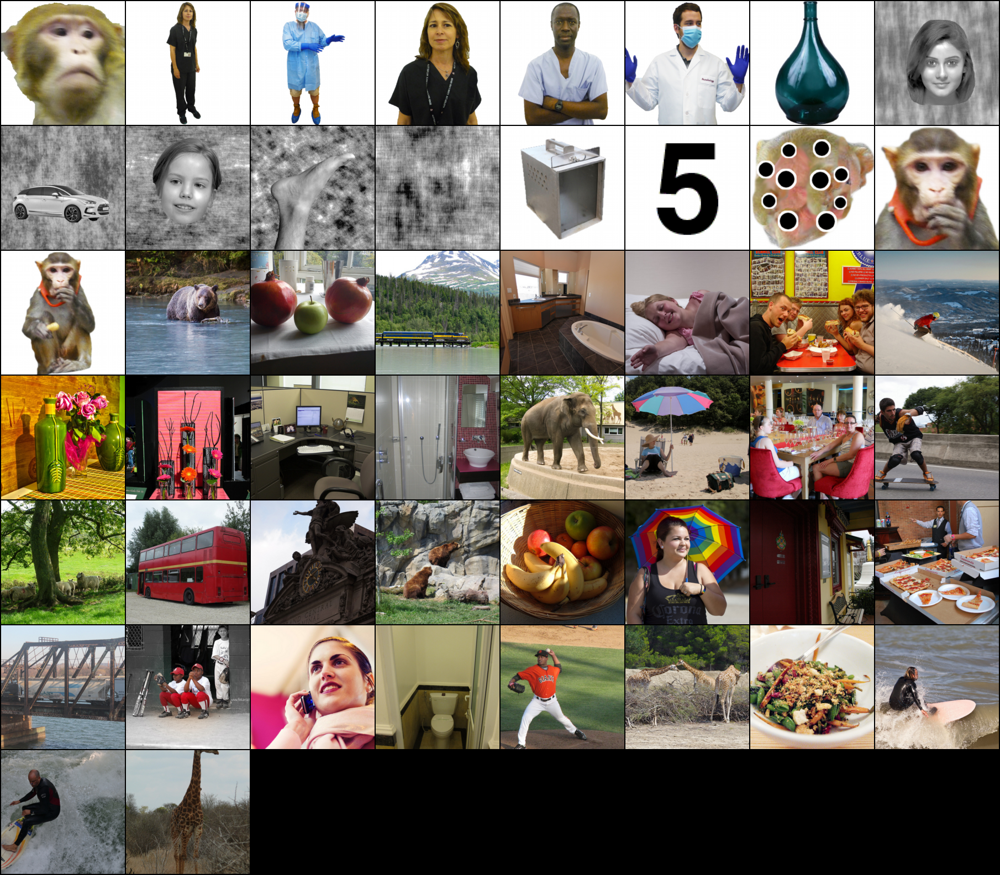

In [95]:
# visualize normalizer images
normalizer_indices = df_stim[df_stim['is_normalizer'] & df_stim['is_train']].index.tolist()
to_imgrid([dataset[i][0] for i in normalizer_indices])

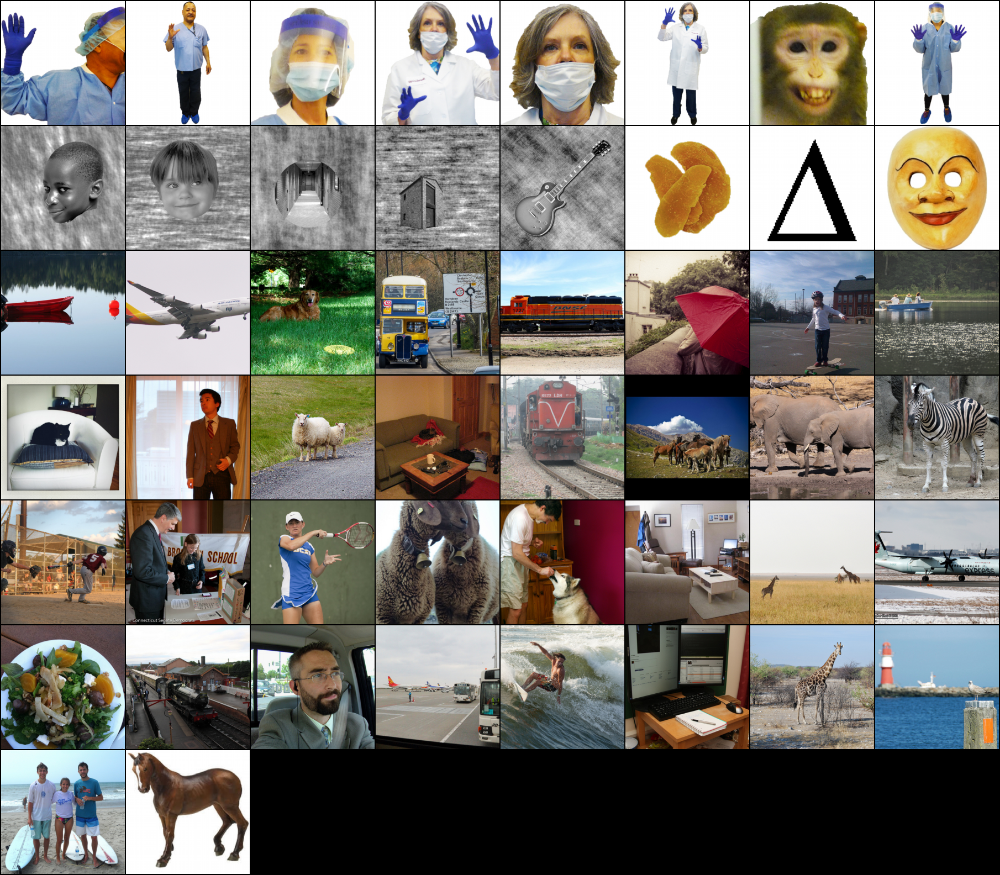

In [96]:
# visualize normalizer images
normalizer_indices = df_stim[df_stim['is_normalizer'] & df_stim['is_test']].index.tolist()
to_imgrid([dataset[i][0] for i in normalizer_indices])

### Obsolete

In [ ]:
# Set random seed for reproducibility
np.random.seed(0) 
# Initialize normalizer column
df_stim['is_normalizer'] = False
# Select normalizers for each partition
train_indices = select_normalizer_indices(df_stim, 'is_nsd', n_select=35)
df_stim.loc[train_indices, 'is_normalizer'] = True
train_indices = select_normalizer_indices(df_stim, 'is_floc', n_select=5)
df_stim.loc[train_indices, 'is_normalizer'] = True
train_indices = select_normalizer_indices(df_stim, 'is_OO', n_select=15)
df_stim.loc[train_indices, 'is_normalizer'] = True
# Report normalizer/non-normalizer counts for each partition
print("\nNormalizer/Non-normalizer split:")
for partition in ['is_nsd', 'is_floc', 'is_OO']:
    print_partition_stats(df_stim, partition, report_col='is_normalizer')
# Overall normalizer/non-normalizer counts
total_normalizer = df_stim['is_normalizer'].sum()
total_not_normalizer = len(df_stim) - total_normalizer
print(f"Overall: {total_normalizer} normalizer ({total_normalizer/len(df_stim):.1%}), {total_not_normalizer} non-normalizer ({total_not_normalizer/len(df_stim):.1%})")

# Initialize normalizer column
df_stim['is_train'] = False
# Select normalizers for each partition
train_indices = select_normalizer_indices(df_stim[~df_stim['is_normalizer']], 'is_nsd', fraction=0.8)
df_stim.loc[train_indices, 'is_train'] = True
train_indices = select_normalizer_indices(df_stim[~df_stim['is_normalizer']], 'is_floc', fraction=0.8)
df_stim.loc[train_indices, 'is_train'] = True
train_indices = select_normalizer_indices(df_stim[~df_stim['is_normalizer']], 'is_OO', fraction=0.8)
df_stim.loc[train_indices, 'is_train'] = True
# Report normalizer/non-normalizer counts for each partition
print("\nTrain/Test split:")
for partition in ['is_nsd', 'is_floc', 'is_OO']:
    print_partition_stats(df_stim, partition, report_col='is_train')
# Overall normalizer/non-normalizer counts
total_train = df_stim['is_train'].sum()
total_test = len(df_stim) - total_train
print(f"Overall: {total_train} train ({total_train/len(df_stim):.1%}), {total_test} test ({total_test/len(df_stim):.1%})")
df_stim["is_test"] = ~df_stim["is_train"] & ~df_stim["is_normalizer"] 


Normalizer/Non-normalizer split:
is_nsd: 35 train (5.4%), 614 test (94.6%)
is_floc: 5 train (8.2%), 56 test (91.8%)
is_OO: 15 train (5.8%), 244 test (94.2%)
Overall: 55 normalizer (5.7%), 914 non-normalizer (94.3%)

Train/Test split:
is_nsd: 491 train (75.7%), 158 test (24.3%)
is_floc: 44 train (72.1%), 17 test (27.9%)
is_OO: 195 train (75.3%), 64 test (24.7%)
Overall: 730 train (75.3%), 239 test (24.7%)


In [90]:
print("normalizer:", sum(df_stim['is_normalizer']))
print("train:", sum(df_stim['is_train']))
print("test:", sum(df_stim['is_test']))
print("train & normalizer (should be 0):", sum(df_stim['is_train'] & df_stim['is_normalizer']))
print("test & normalizer (should be 0):", sum(df_stim['is_test'] & df_stim['is_normalizer'])) # test normalizer

normalizer: 55
train: 730
test: 184
train & normalizer (should be 0): 0
test & normalizer (should be 0): 0


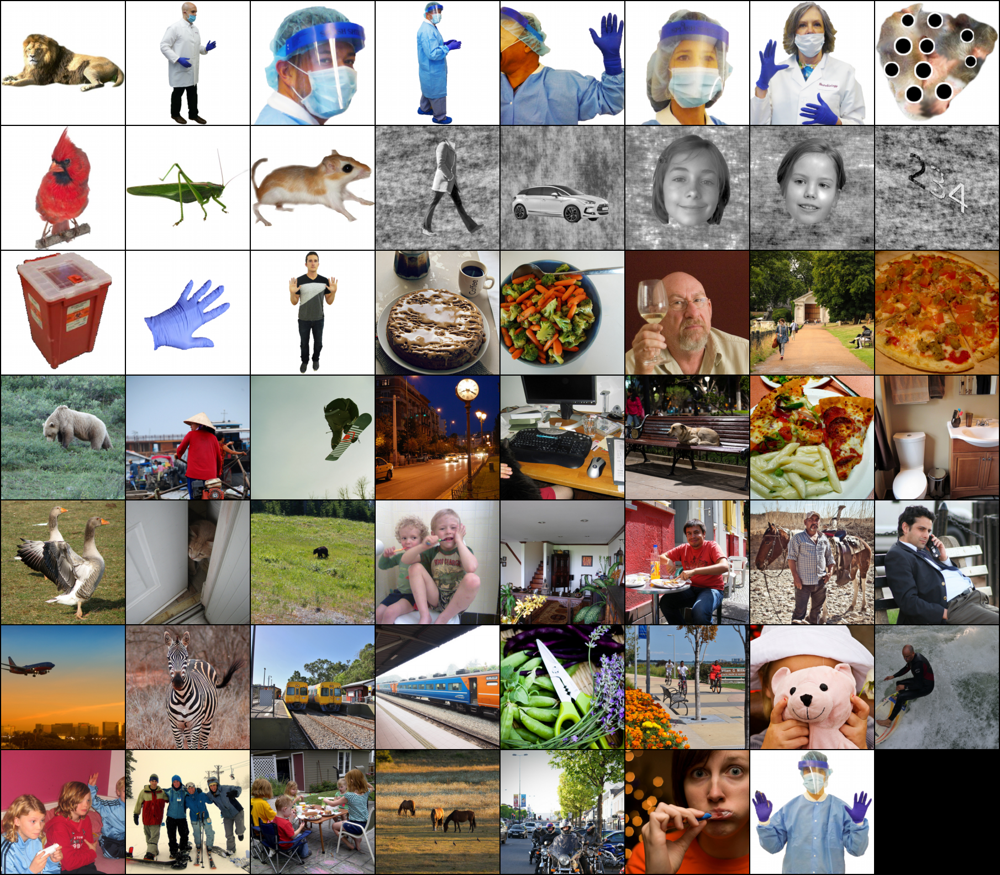

In [91]:
# visualize normalizer images
normalizer_indices = df_stim[df_stim['is_normalizer']].index.tolist()
to_imgrid([dataset[i][0] for i in normalizer_indices])

In [51]:
# Create train/test split (80/20) for each partition
import numpy as np
# Set random seed for reproducibility
np.random.seed(42)
# Initialize train/test column (1 for train, 0 for test)
df_stim['is_train'] = False

# For each partition (NSD, fLoc, OO), randomly select 80% for training
for partition in ['is_nsd', 'is_floc', 'is_OO']:
    # Get indices for this partition
    partition_indices = df_stim[df_stim[partition]].index.tolist()
    # Randomly select 80% of indices for training
    n_train = int(len(partition_indices) * 0.8)
    train_indices = np.random.choice(partition_indices, size=n_train, replace=False)
    # Mark selected indices as training data
    df_stim.loc[train_indices, 'is_train'] = True

# Report train/test counts for each partition
print("\nTrain/Test split:")
for partition in ['is_nsd', 'is_floc', 'is_OO']:
    train_count = df_stim[df_stim[partition] & (df_stim['is_train'] == 1)].shape[0]
    test_count = df_stim[df_stim[partition] & (df_stim['is_train'] == 0)].shape[0]
    total = train_count + test_count
    print(f"{partition}: {train_count} train ({train_count/total:.1%}), {test_count} test ({test_count/total:.1%})")

# Overall train/test counts
total_train = df_stim['is_train'].sum()
total_test = len(df_stim) - total_train
print(f"Overall: {total_train} train ({total_train/len(df_stim):.1%}), {total_test} test ({total_test/len(df_stim):.1%})")

NSD:  649
fLOC:  61
OO:  259

Train/Test split:
is_nsd: 519 train (80.0%), 130 test (20.0%)
is_floc: 48 train (78.7%), 13 test (21.3%)
is_OO: 207 train (79.9%), 52 test (20.1%)
Overall: 774 train (79.9%), 195 test (20.1%)


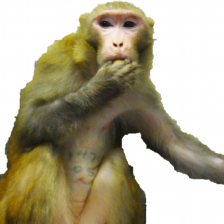

In [36]:
ToPILImage()(dataset[2][0])

### Neural Regress Testing